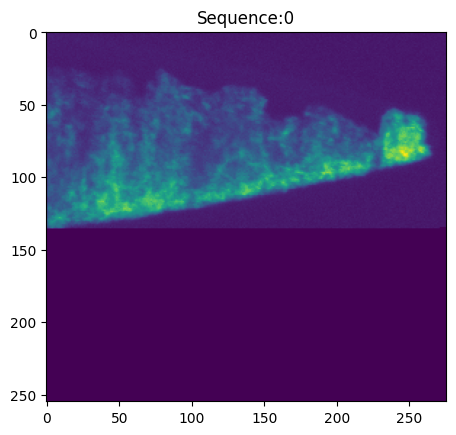

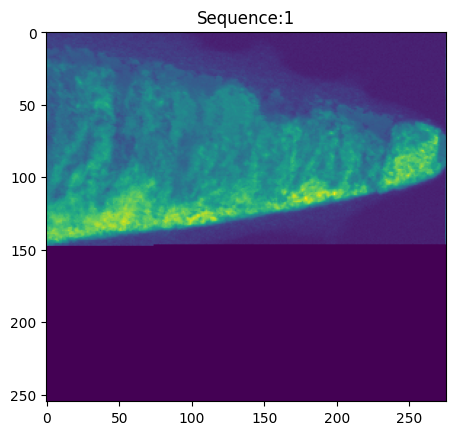

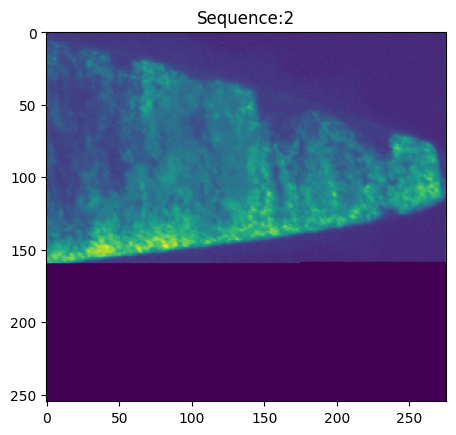

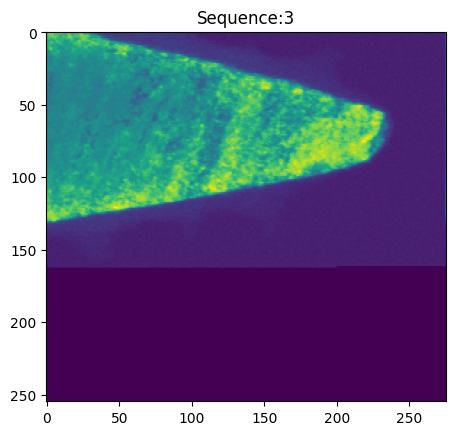

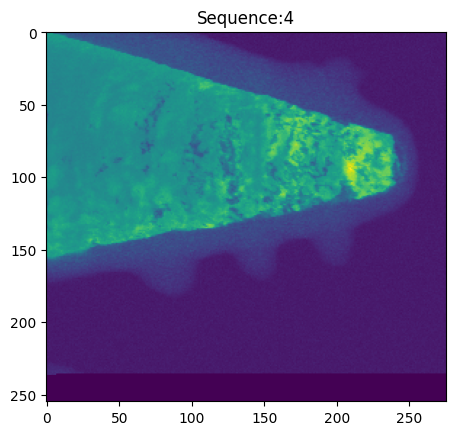

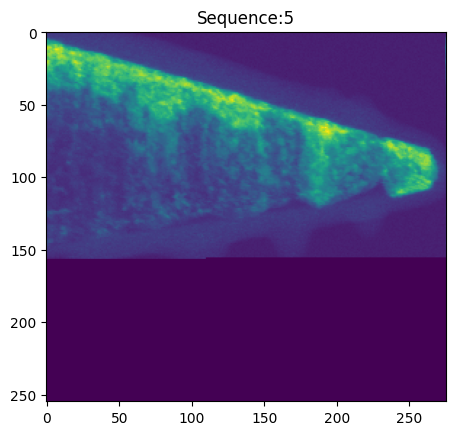

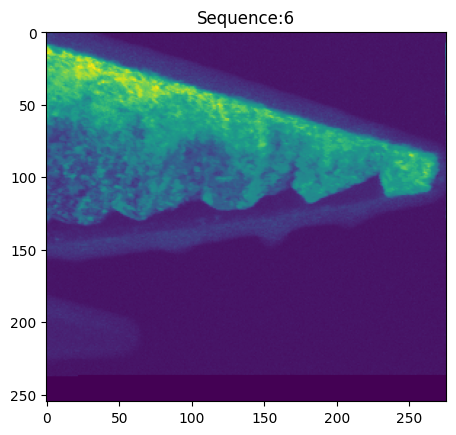

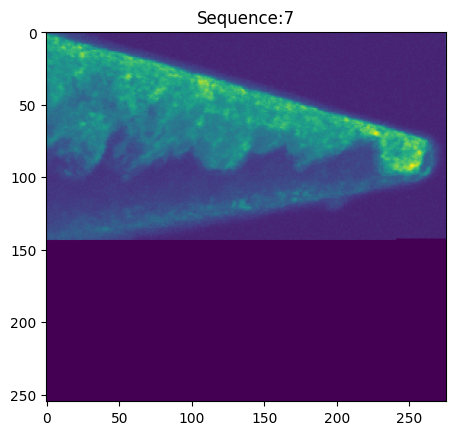

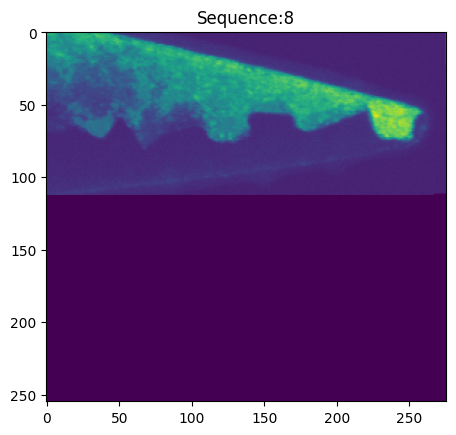

In [273]:
# import PySide2
from PySide2.QtCore import QCoreApplication, QFile, QPointF, Qt
from PySide2.QtGui import QIcon
from PySide2.QtUiTools import QUiLoader
from PySide2.QtWidgets import (
    QApplication,
    QFileDialog,
    QMainWindow,
    QMessageBox,
    QTableWidgetItem,
)
import math
import tkinter as tk
from tkinter import ttk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from ncempy.io import mrc
from ncempy.io.mrc import mrcReader
import matplotlib.pyplot as plt 
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np

f1name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(f1name) 
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

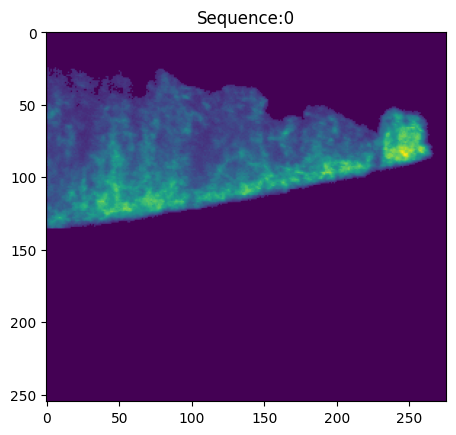

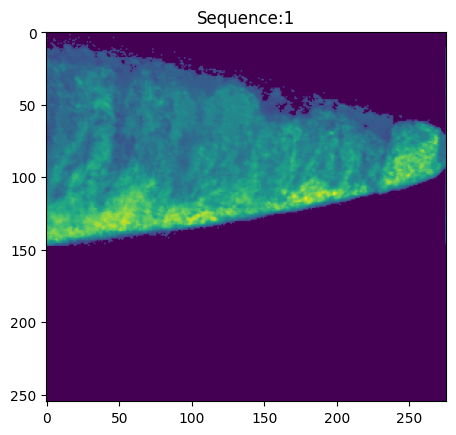

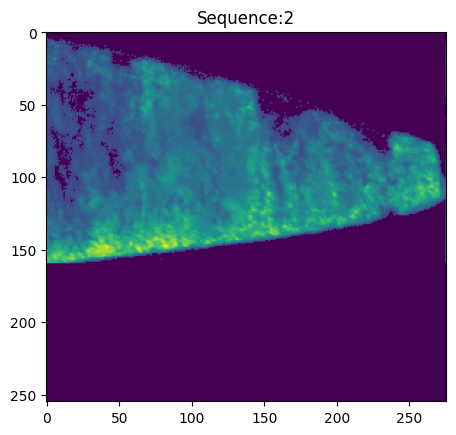

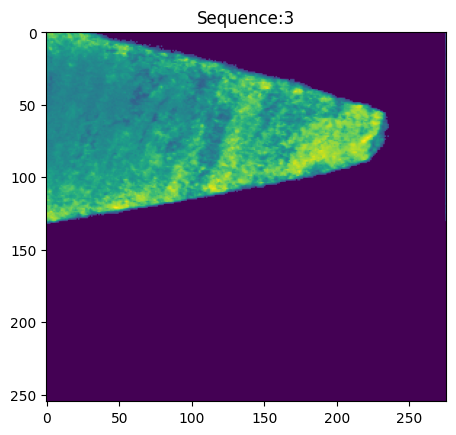

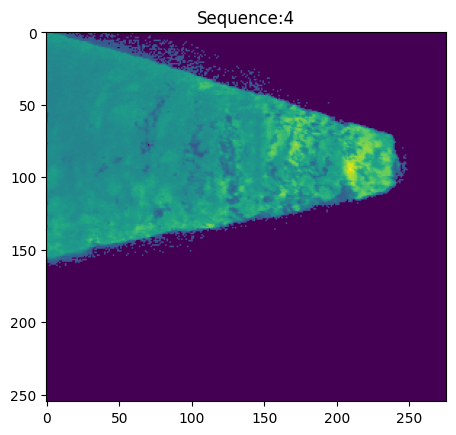

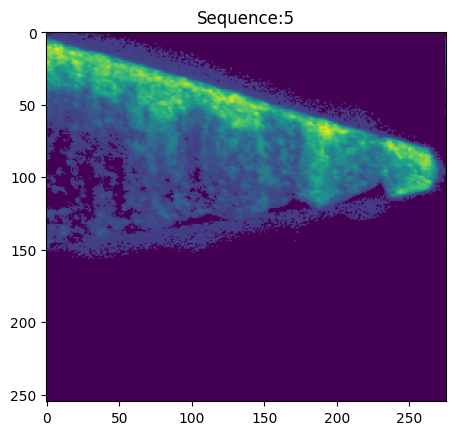

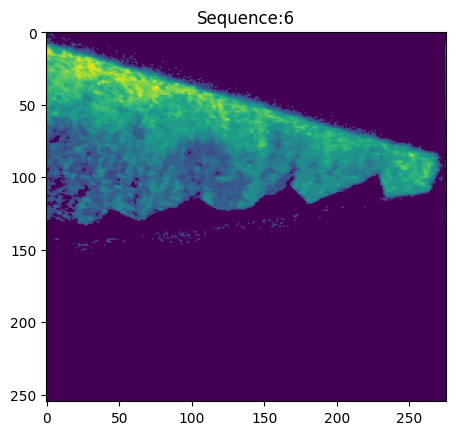

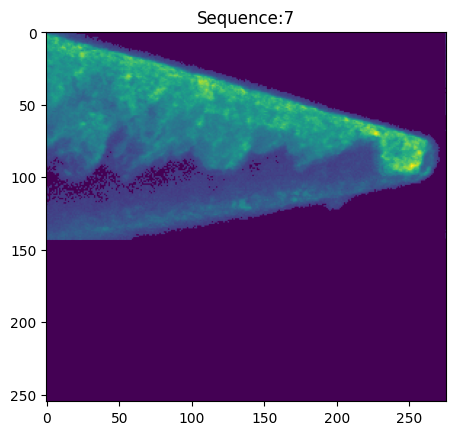

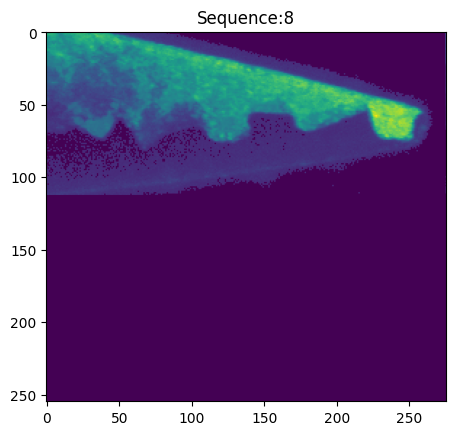

In [267]:
# Set background as 0

mrc1['data'][mrc1['data'] < 1.5e-5] = 0

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

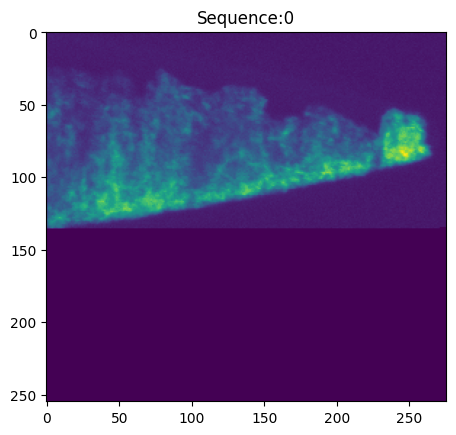

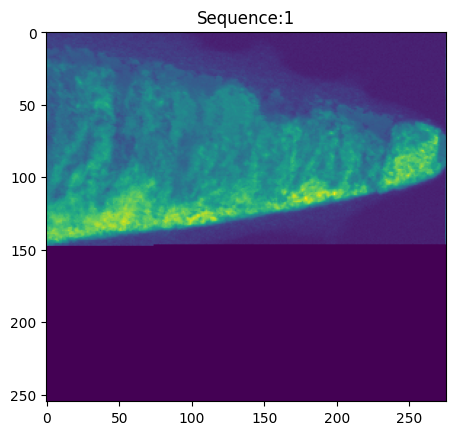

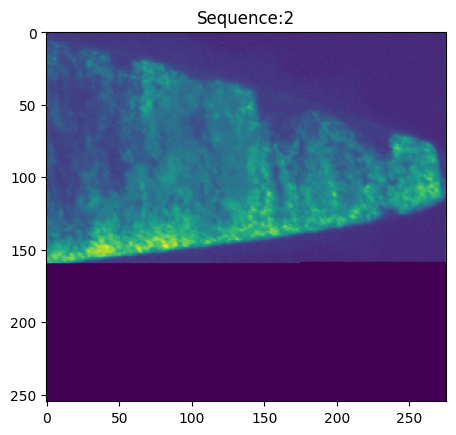

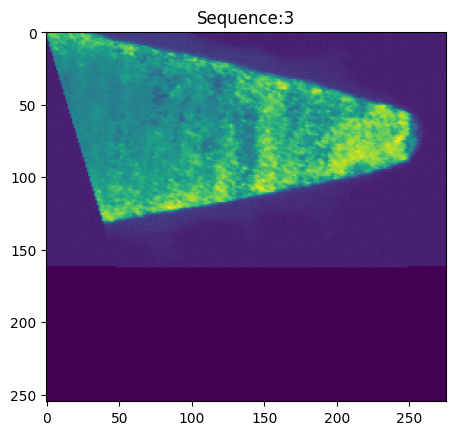

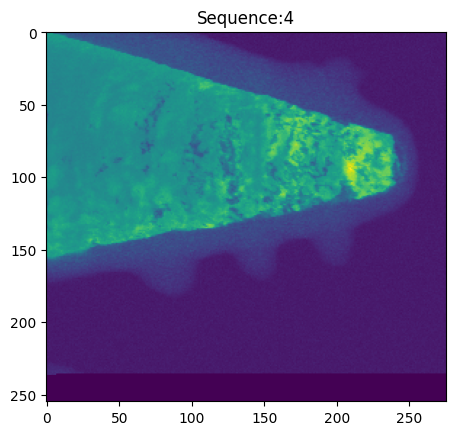

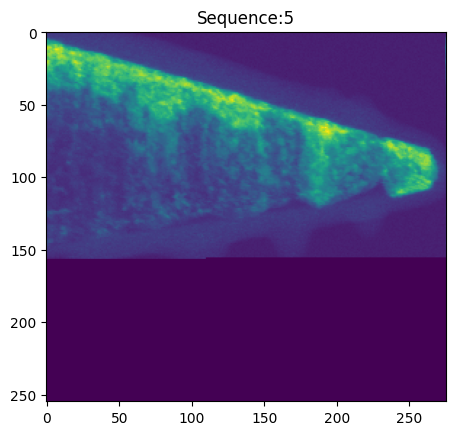

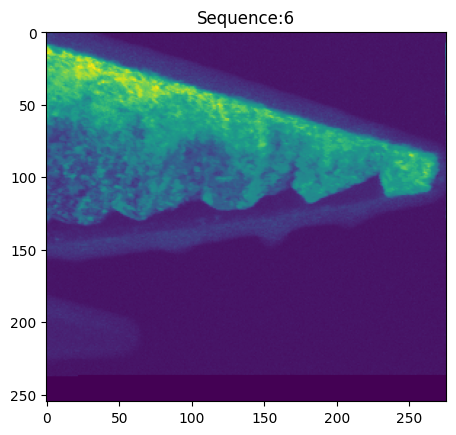

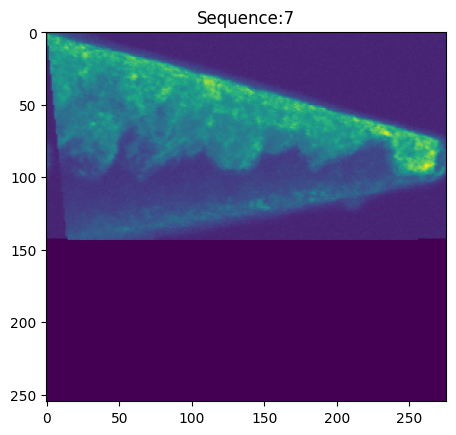

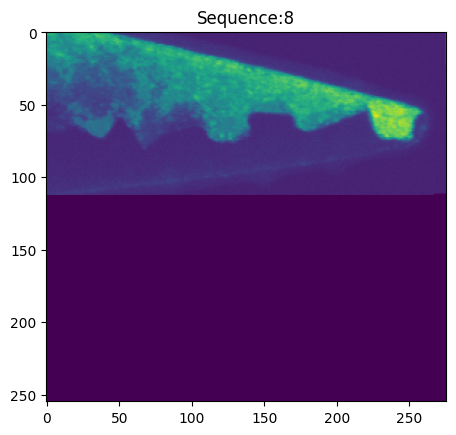

In [275]:
# left Drift compensation
row_index = 0  #  row_index is the start row number
rowdrifty=1  #initial value
seq=7 #image sequence
drift_factor=0.1; # left drift value of next row

for row in mrc1['data'][seq]:
    shifted_row = np.append(mrc1['data'][seq][row_index][-math.floor(rowdrifty):mrc1['data'][seq].shape[1]],mrc1['data'][seq][row_index][:-math.floor(rowdrifty)]) # append with [0,...]
    mrc1['data'][seq][row_index] = shifted_row 
    row_index=row_index+1
    rowdrifty=rowdrifty+drift_factor

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

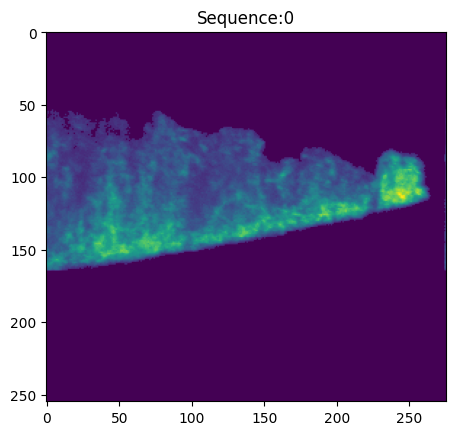

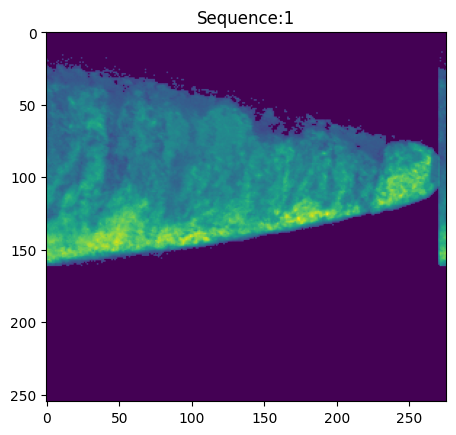

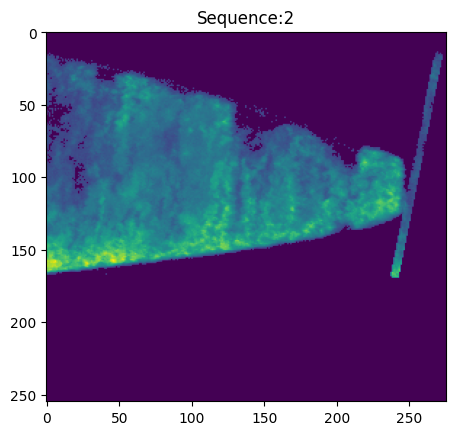

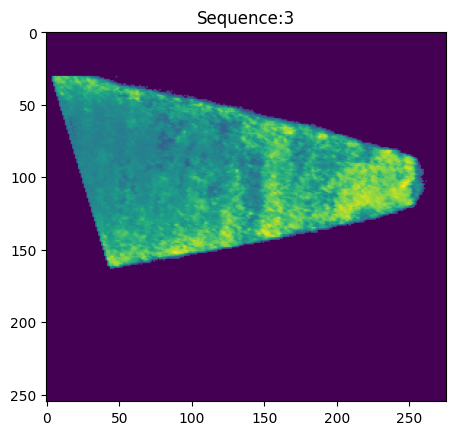

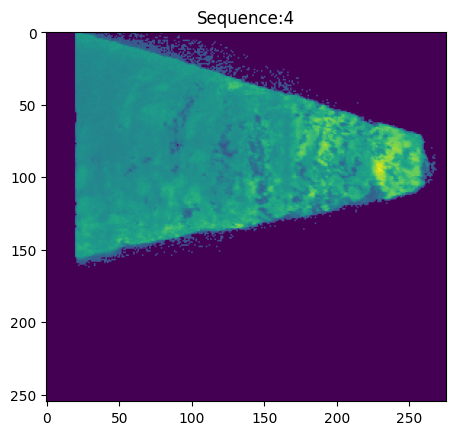

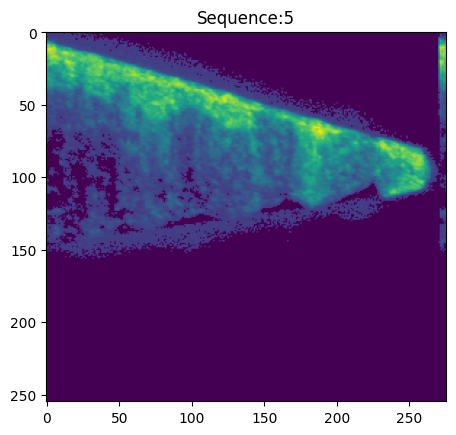

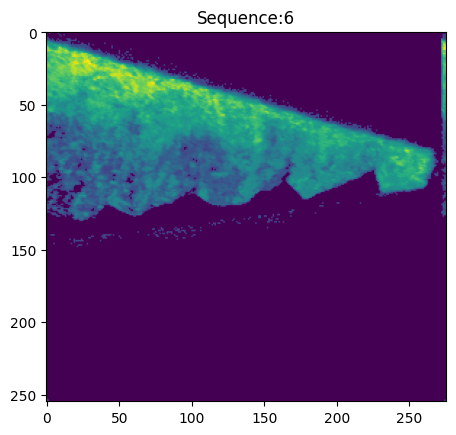

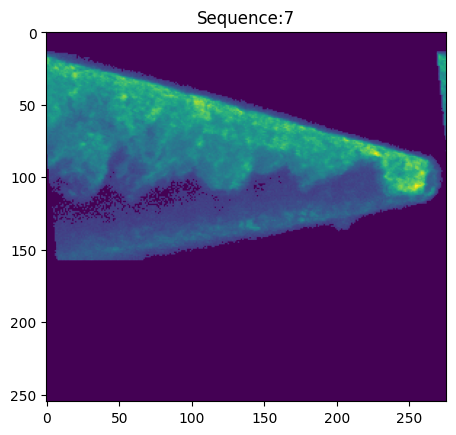

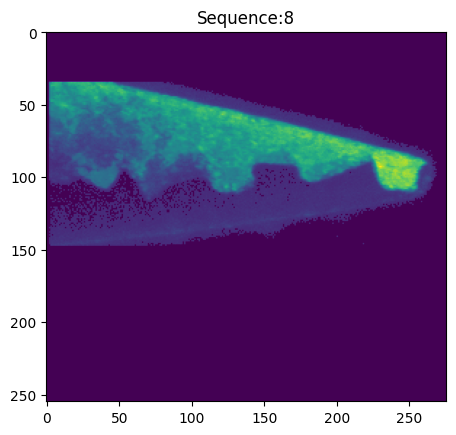

In [298]:
# right Drift compensation
row_index = 0  #  row_index is the start row number
rowdrifty=0  #initial value
seq=2 #image sequence
drift_factor=0.2; # left drift value of next row
for row in mrc1['data'][seq]:
    shifted_row = np.append(mrc1['data'][seq][row_index][math.floor(rowdrifty):],[0] * math.floor(rowdrifty)) # append with [0,...]
    mrc1['data'][seq][row_index] = shifted_row 
    row_index=row_index+1
    rowdrifty=rowdrifty+drift_factor


i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

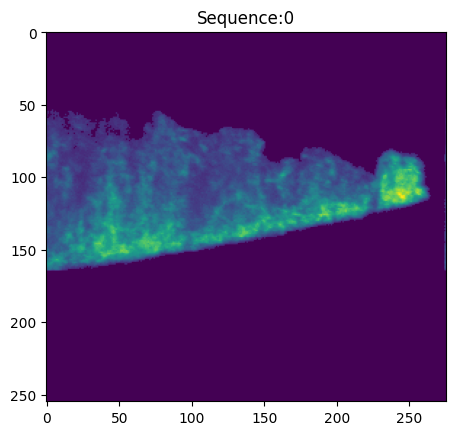

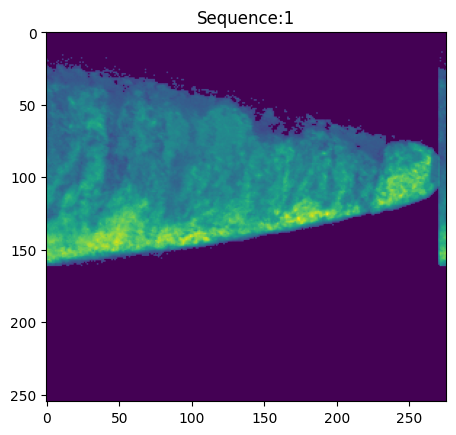

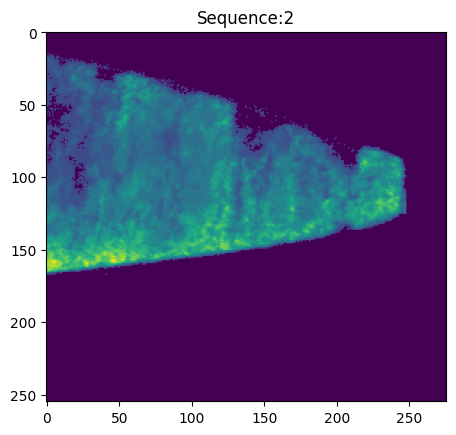

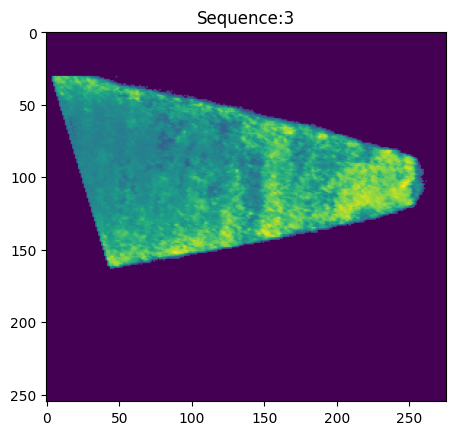

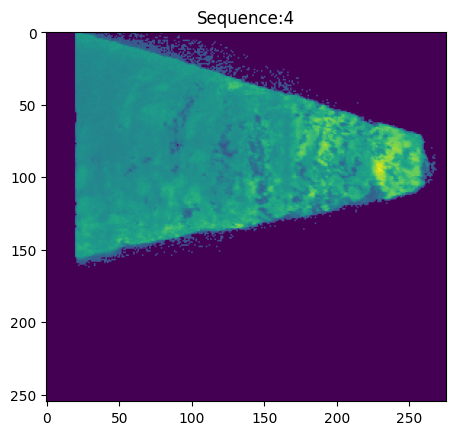

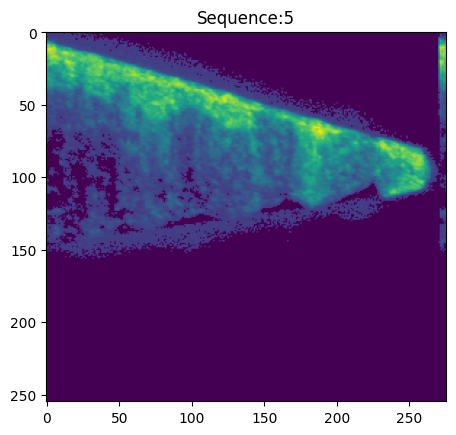

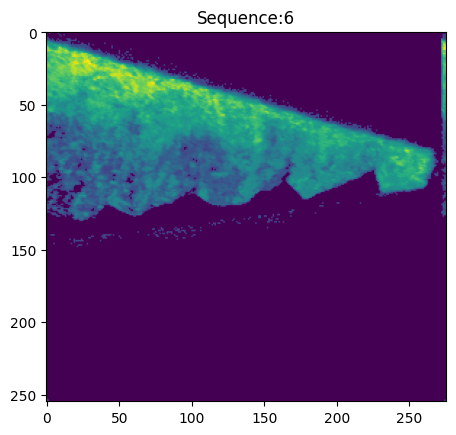

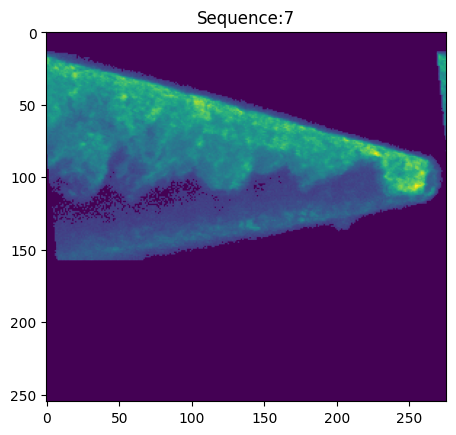

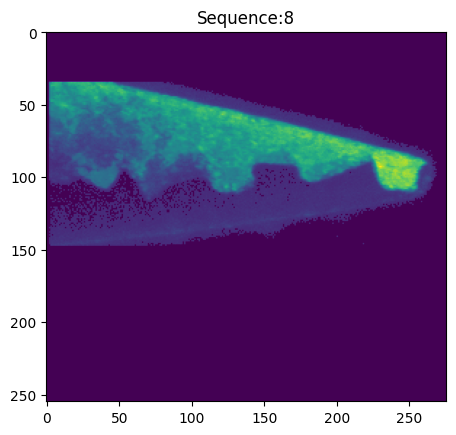

In [307]:
#Erase some parts
mrc1['data'][2][:,248:275]=0  #trim_y_mrc
mrc1['data'][2][126:200,243:275]=0  #trim_y_mrc
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1

In [265]:
# Comparing two .mrc files with same shape
f1name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(f1name) 
f2name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc2 = mrc.mrcReader(f2name) 

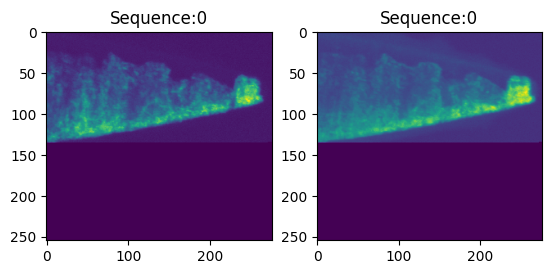

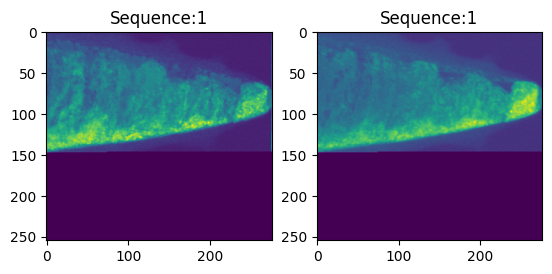

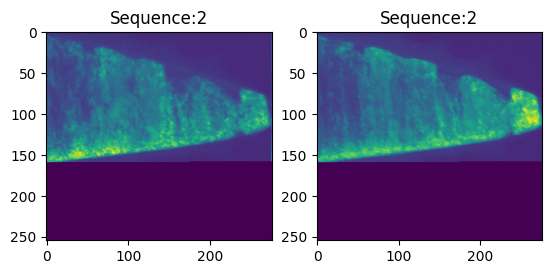

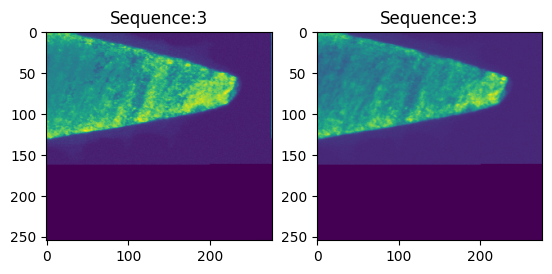

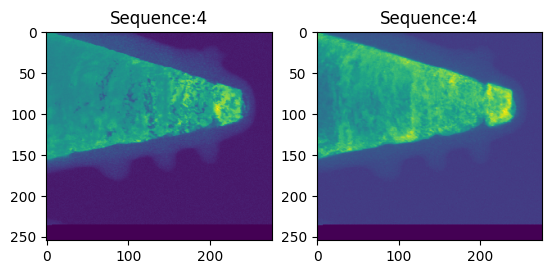

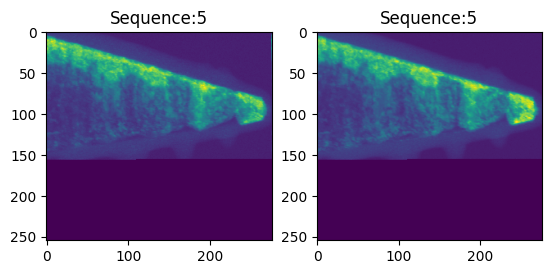

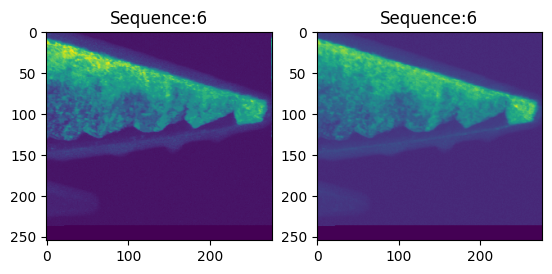

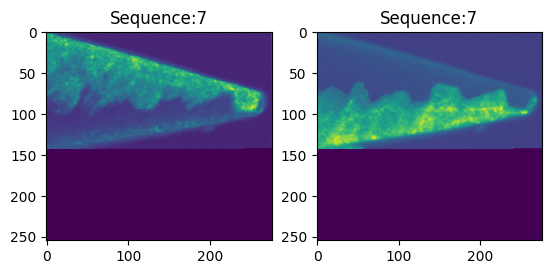

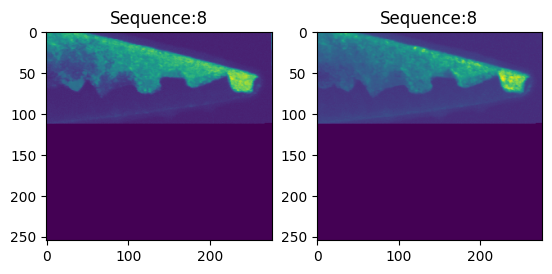

In [109]:
# Comparing two .mrc files with same shape
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    

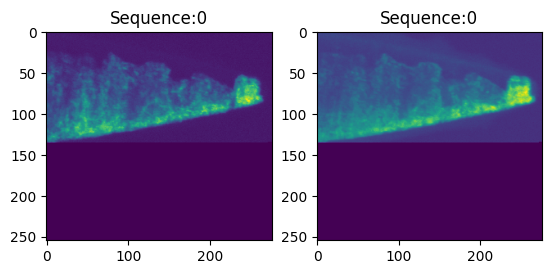

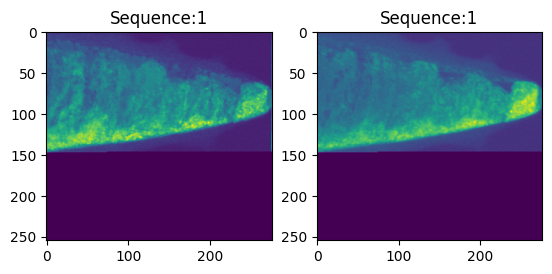

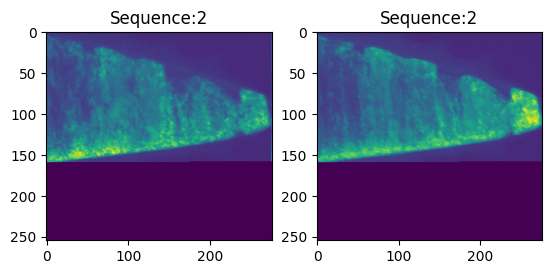

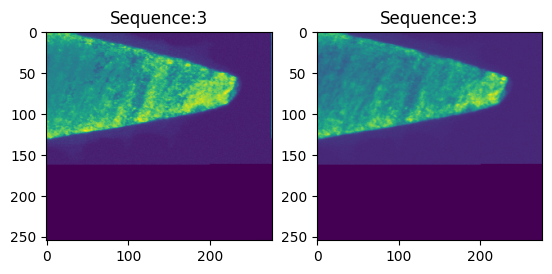

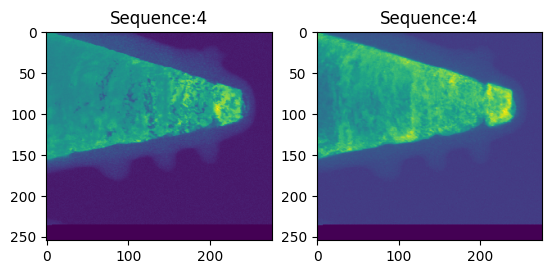

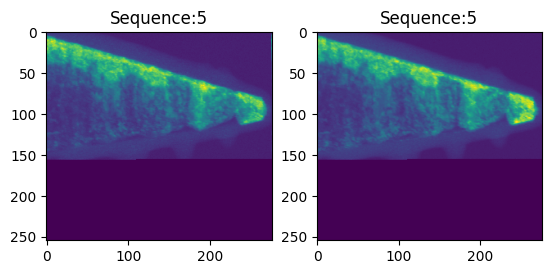

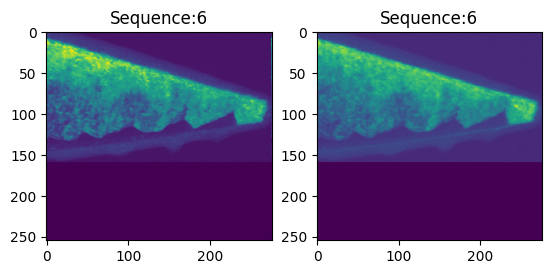

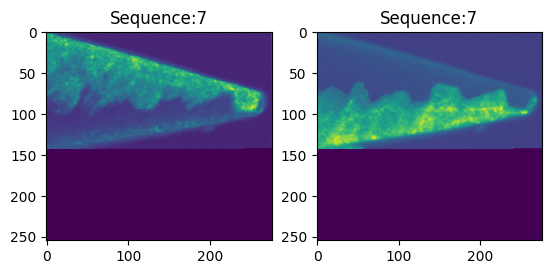

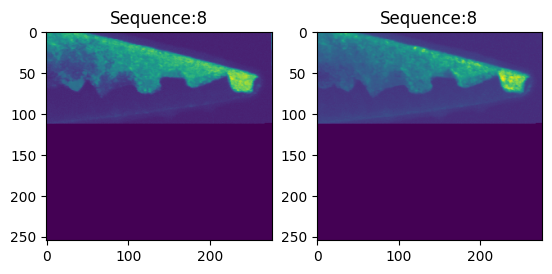

In [96]:
# Erase parts of image by 0
mrc1['data'][6, 160:256, :]=0  #trim_y_mrc i is sequence
mrc2['data'][6, 160:256, :]=0  #trim_y_mrc
i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'] [i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


In [97]:
# Find head points
i=0
for matrix in mrc1['data']:
    i=i+1
    # Use the np.argwhere() function to find indices of non-zero values
    head_indices = np.argwhere(matrix > 6e-5)
    if len(head_indices) > 0:
        rightmost_head_point = head_indices[np.argmax(head_indices[:, 1])]
        row, col = rightmost_head_point[0], rightmost_head_point[1]
        print("Coordinates of the rightmost head point (row, column):", (row, col))
    else:
        print("No head points in the image")


Coordinates of the rightmost head point (row, column): (81, 262)
Coordinates of the rightmost head point (row, column): (76, 268)
Coordinates of the rightmost head point (row, column): (138, 154)
Coordinates of the rightmost head point (row, column): (59, 228)
No head points in the image
Coordinates of the rightmost head point (row, column): (90, 265)
Coordinates of the rightmost head point (row, column): (93, 263)
Coordinates of the rightmost head point (row, column): (76, 260)
Coordinates of the rightmost head point (row, column): (55, 257)


In [276]:
# head point
headpoint = []
headpoint.append([81, 262])
headpoint.append([76, 268])
headpoint.append([50, 270])
headpoint.append([59, 256])
headpoint.append([90, 240])
headpoint.append([90, 265])
headpoint.append([93, 263])
headpoint.append([76, 267])
headpoint.append([55, 257])

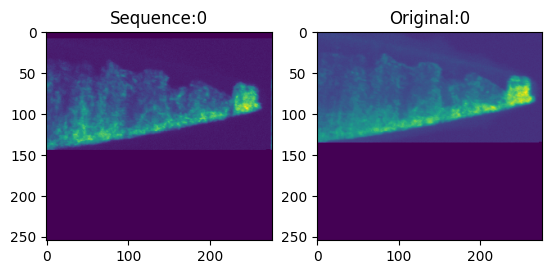

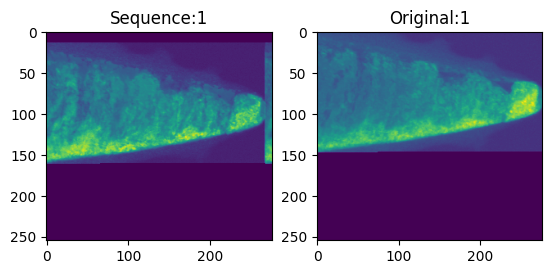

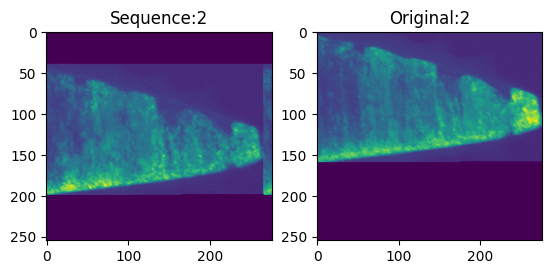

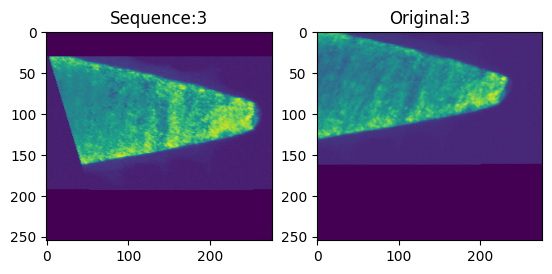

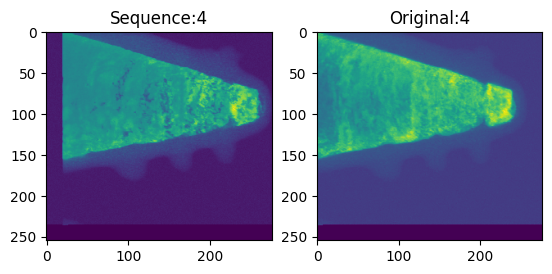

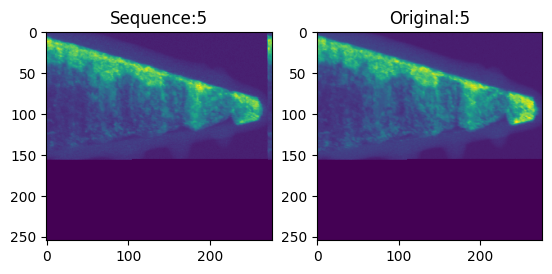

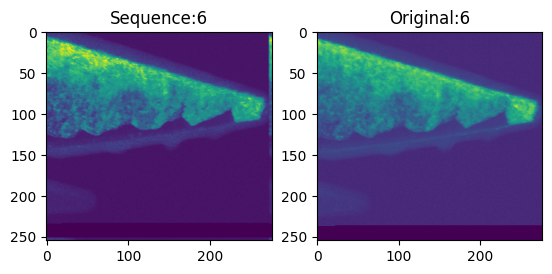

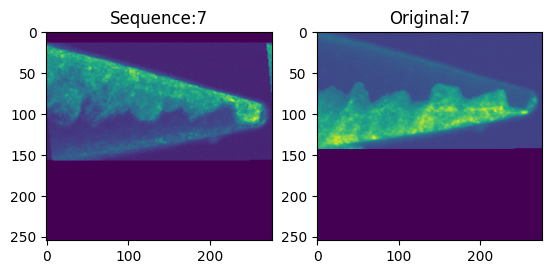

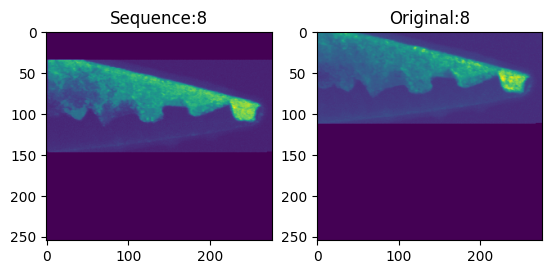

In [277]:
# Coarse align the heads of image to alignpoint
alignpoint=[90,260]
mrc1_temp=mrc1['data']

i=0
for matrix in mrc1['data']:
    shift_x=headpoint[i][1]-alignpoint[1]
    shift_y=headpoint[i][0]-alignpoint[0]
    mrc1_temp[i,:,:]=np.roll(mrc1['data'][i,:,:], (-shift_y, -shift_x), axis=(0, 1))
    i=i+1
    

i=0
for matrix in mrc1['data']:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(mrc1['data'][i, :, :])
    plt.title("Sequence:"+ str(i))
    plt.subplot(1, 2, 2)
    plt.imshow(mrc2['data'][i, :, :])
    plt.title("Original:"+ str(i))
    i=i+1

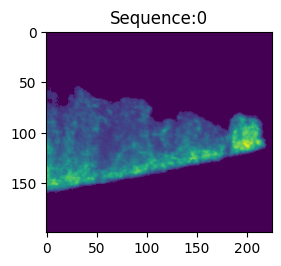

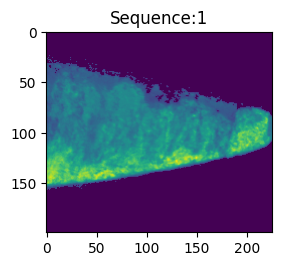

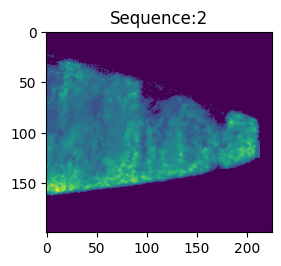

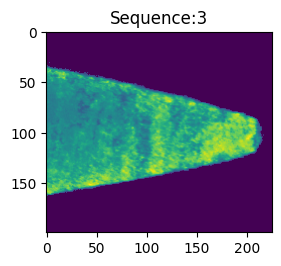

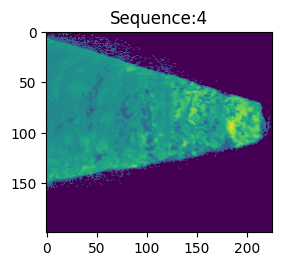

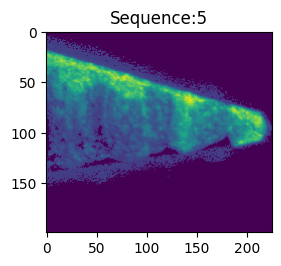

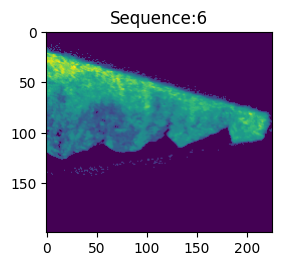

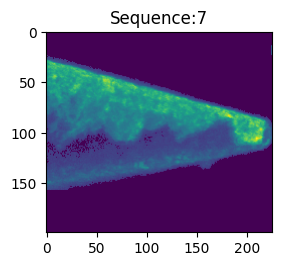

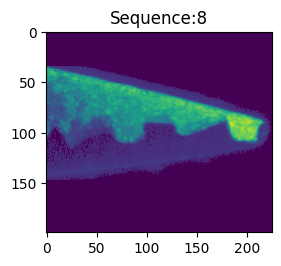

In [315]:
mrc1['data'][mrc1['data'] < 1.5e-5] = 0
mrc1['data'][2,:,:]=np.roll(mrc1['data'][2,:,:], (0, -5), axis=(0, 1))#shift down

#Trim mrc
matrix_trim = np.zeros((mrc1['data'].shape[0],200, 225))

i=0
for matrix in mrc1['data']:
    matrix_trim[i] = mrc1['data'][i,:,:][0:200,45:270]
    i=i+1
    
i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


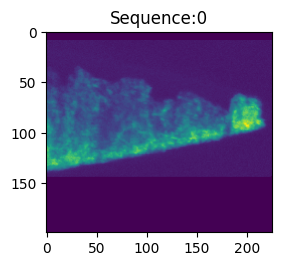

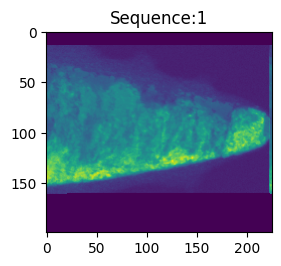

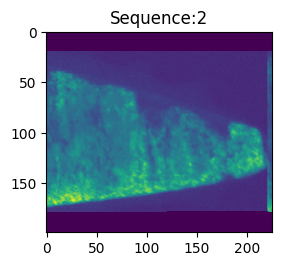

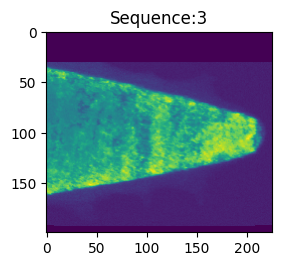

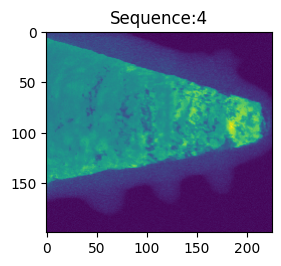

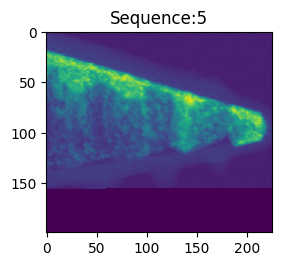

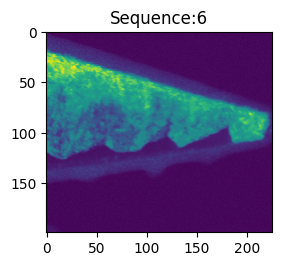

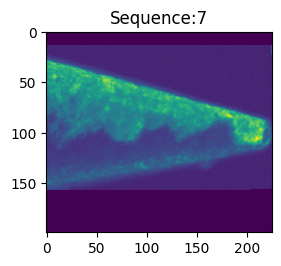

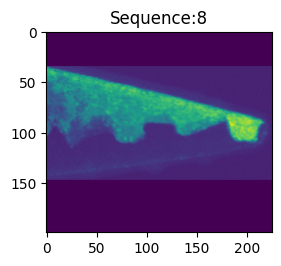

In [282]:
# Final adjustment

matrix_trim[2,:,:]=np.roll(matrix_trim[2,:,:], (-20, 0), axis=(0, 1))#shift down

i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1


In [316]:
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

New MRC file saved: C:/4DSTEM data analysis/2023-08-16_FeB_PV/Analysis/MRC/Components 80_new_trim.mrc.


New MRC file saved: C:/4DSTEM data analysis/2023-08-16_FeB_PV/Analysis/MRC/Components80_new_trim_cut.mrc.


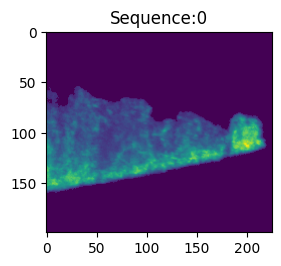

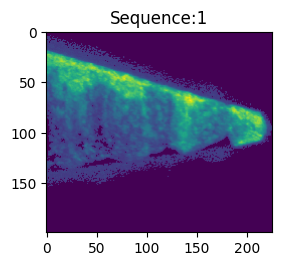

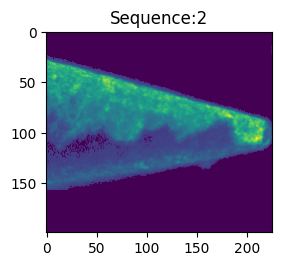

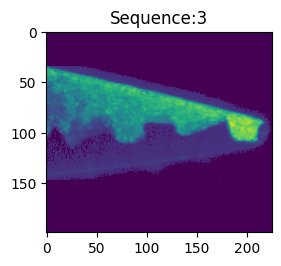

In [26]:
#remove some slices form MRC

# import PySide2
from PySide2.QtCore import QCoreApplication, QFile, QPointF, Qt
from PySide2.QtGui import QIcon
from PySide2.QtUiTools import QUiLoader
from PySide2.QtWidgets import (
    QApplication,
    QFileDialog,
    QMainWindow,
    QMessageBox,
    QTableWidgetItem,
)
import math
import tkinter as tk
from tkinter import ttk
from matplotlib.figure import Figure
from matplotlib.backends.backend_tkagg import FigureCanvasTkAgg
from ncempy.io import mrc
from ncempy.io.mrc import mrcReader
import matplotlib.pyplot as plt 
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np

#remove some slices form MRC
f1name = filedialog.askopenfilename(filetypes=[("Image files", "*.mrc")])
mrc1 = mrc.mrcReader(f1name) 
remove_seq=[0,5,7,8] # specifiy which slices to be removed

#skip and 
matrix_trim = np.zeros((len(remove_seq),mrc1['data'].shape[1], mrc1['data'].shape[2]))

i=0
for item in remove_seq:
    matrix_trim[i] = mrc1['data'][remove_seq[i],:,:]
    i=i+1
    
i=0
for matrix in matrix_trim:
    plt.figure()
    plt.subplot(1, 2, 1)
    plt.imshow(matrix_trim[i, :, :])
    plt.title("Sequence:"+ str(i))
    i=i+1
    
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

In [25]:
#write MRC
#Dtype
save_filepath = filedialog.asksaveasfilename(
    defaultextension=".mrc",  # Default file extension
    filetypes=[("MRC files", "*.mrc"), ("All files", "*.*")],  # Filter file types
    title="Save As"  # Dialog title
)
mrc2=mrc.mrcWriter(save_filepath, matrix_trim.astype('float32'), mrc1['pixelSize'])
msg = f"New MRC file saved: {save_filepath}."
print(msg)

New MRC file saved: C:/4DSTEM data analysis/2023-08-16_FeB_PV/Analysis/MRC/Components80_new_trim_cut.mrc.


In [6]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np

# 创建主窗口
root = tk.Tk()
root.title("图像编辑器")

# 打开图像按钮的回调函数
def open_image():
    file_path = filedialog.askopenfilename(filetypes=[("图像文件", "*.png *.jpg *.jpeg *.bmp *.gif *.tif")])
    if file_path:
        global canvas, image_data
        image = Image.open(file_path)
        image_data = np.array(image)
        img_tk = ImageTk.PhotoImage(image=image)
        canvas.create_image(0, 0, anchor=tk.NW, image=img_tk)
        canvas.image = img_tk  # 保持对图像的引用

# 鼠标左键按住时的回调函数
def on_mouse_down(event):
    global last_x, last_y
    last_x, last_y = event.x, event.y

# 鼠标拖动时的回调函数
def on_mouse_drag(event):
    global last_x, last_y, image_data
    x, y = event.x, event.y
    radius = 10  # 定义要擦除的像素半径

    # 将鼠标路径上的像素设置为白色（擦除）
    for i in range(min(last_x, x) - radius, max(last_x, x) + radius):
        for j in range(min(last_y, y) - radius, max(last_y, y) + radius):
            if 0 <= i < image_data.shape[1] and 0 <= j < image_data.shape[0]:
                image_data[j, i] = [255, 255, 255]

    # 更新Canvas上的图像
    updated_image = Image.fromarray(image_data)
    updated_tk_image = ImageTk.PhotoImage(image=updated_image)
    canvas.create_image(0, 0, anchor=tk.NW, image=updated_tk_image)
    canvas.image = updated_tk_image

    last_x, last_y = x, y

# 创建打开图像按钮
open_button = tk.Button(root, text="打开图像", command=open_image)
open_button.pack()

# 创建Canvas用于显示图像
canvas = tk.Canvas(root, width=400, height=400)
canvas.pack()

# 初始化鼠标位置
last_x, last_y = None, None

# 绑定鼠标按住事件和拖动事件
canvas.bind("<Button-1>", on_mouse_down)
canvas.bind("<B1-Motion>", on_mouse_drag)

# 运行主循环
root.mainloop()

